## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## 1. First, I'll compute the camera calibration using chessboard images

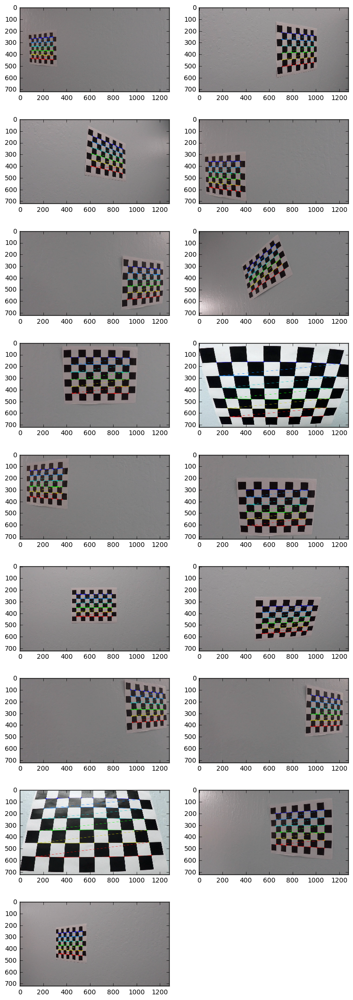

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

def display_images_in_2_colums(images, captions=None, cmap=None):
    fig = plt.figure(figsize=(9, 3 * np.ceil(len(images) / 2.)))
    for i in range(len(images)):
        a = fig.add_subplot(np.ceil(len(images) / 2.), 2, i + 1)
        img = images[i]
        plt.imshow(img, cmap=cmap)
        if (not captions is None):
            a.set_title(captions[i])
    plt.show()

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')
chb_images = []
# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        chb_images.append(img)

#displaying the images with recognized chessboard corners
display_images_in_2_colums(chb_images)


In [2]:
#now, after we made sure that all the corners are properly placed, let's calibrate the camera
retval, matrix, dist, rvec, tvec = cv2.calibrateCamera(objpoints, imgpoints, chb_images[0].shape[0:2], None, None)
print("calibrateCamera returned the following corretion matrix:\n{}".format(matrix))


calibrateCamera returned the following corretion matrix:
[[  1.15777829e+03   0.00000000e+00   6.67113866e+02]
 [  0.00000000e+00   1.15282230e+03   3.86124658e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]


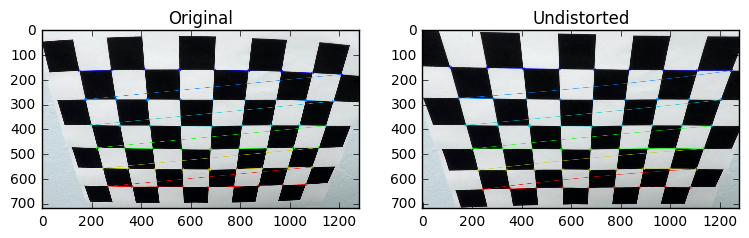

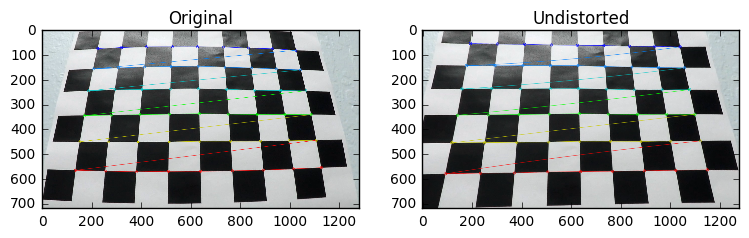

In [3]:
#let's display a pair: original / undistorted and make sure the camera was properly calibrated
undistored_images = [chb_images[7], cv2.undistort(chb_images[7], matrix, dist, None, matrix)]
display_images_in_2_colums(undistored_images, ["Original", "Undistorted"])
undistored_images = [chb_images[14], cv2.undistort(chb_images[14], matrix, dist, None, matrix)]
display_images_in_2_colums(undistored_images, ["Original", "Undistorted"])

## 2. Apply a distortion correction to raw images.

Now let's undestort some road images from the test folder.
We can see that the test images are being corrected as well by comparing closely the content of the images in their corners: shapes of the trees - is the best indicator.

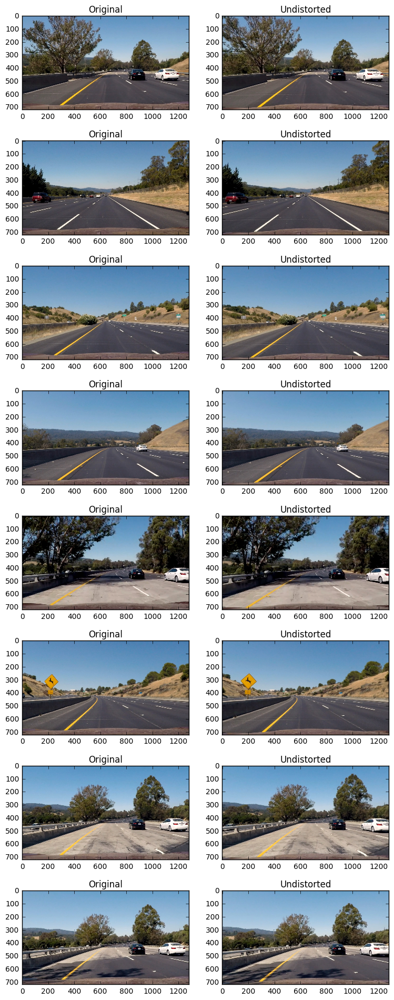

In [4]:
# Make a list of test images
images = glob.glob('./test_images/*.jpg')
disp_images = []
captions = []
tst_images = [] #this will contain undistorted test images only
# Step through the list and undistort the images
for fname in images:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    disp_images.append(img)
    captions.append("Original")
    tst_img = cv2.undistort(img, matrix, dist, None, matrix)
    disp_images.append(tst_img)
    captions.append("Undistorted")
    tst_images.append(tst_img)
display_images_in_2_colums(disp_images, captions)    


## 3. Use color transforms, gradients, etc., to create a thresholded binary image

OK, now, once we are done with optical distortions, let's do lane detection using various color and HLS channels.

In [5]:
#let's create some helpful toolset here first
def gray(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

def hls(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2HLS)

def hue(img):
    return hls(img)[:,:,0]

def light(img):
    return hls(img)[:,:,1]

def saturation(img):
    return hls(img)[:,:,2]

def bin_filter(channel, thresh=(0,255)):
    binary_output = np.zeros_like(channel)
    binary_output[(channel >= thresh[0]) & (channel < thresh[1])] = 1
    return binary_output

def sobelX(channel, ksize=3):
    return cv2.Sobel(channel, cv2.CV_64F, 1, 0, ksize=ksize)

def sobelY(channel, ksize=3):
    return cv2.Sobel(channel, cv2.CV_64F, 0, 1, ksize=ksize)

def abs_sobel_thresh(channel, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # 1) takes in one channel image - e.g. after GRAY or one of the HLS channels
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image
    if orient == 'x':
        sobel = sobelX(channel, ksize=sobel_kernel)
    else:
        sobel = sobelY(channel, ksize=sobel_kernel)
    abs_sobel = np.absolute(sobel)    
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    return bin_filter(scaled_sobel, thresh)

def mag_thresh(channel, sobel_kernel=3, thresh=(0, 255)):
    # 1) takes in one channel image - e.g. after GRAY or one of the HLS channels
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 5) Create a binary mask where mag thresholds are met
    # 6) Return this mask as your binary_output image
    sobelX = cv2.Sobel(channel, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobelY = cv2.Sobel(channel, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    magnitude = np.sqrt(np.square(sobelX) + np.square(sobelY))
    scaled_mag = np.uint8(255 * magnitude / np.max(magnitude))
    return bin_filter(scaled_mag, thresh)

def dir_threshold(channel, sobel_kernel=3, thresh=(0, np.pi/2)):
    # 1) takes in one channel image - e.g. after GRAY or one of the HLS channels
    # 2) Take the gradient in x and y separately
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as your binary_output image
    sobelX = cv2.Sobel(channel, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobelY = cv2.Sobel(channel, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobX = np.absolute(sobelX)
    abs_sobY = np.absolute(sobelY)
    grad_dir = np.arctan2(abs_sobY, abs_sobX)
    return bin_filter(grad_dir, thresh)

def and_op(im1, im2):
    #combines binary images using AND operation
    img = np.zeros_like(im1)
    img[(im1 == 1) & (im2 == 1)] = 1
    return img

def or_op(im1, im2):
    #combines binary images using OR operation
    img = np.zeros_like(im1)
    img[(im1 == 1) | (im2 == 1)] = 1
    return img
    

GRAY / SOBEL_X: testing kernel sizes


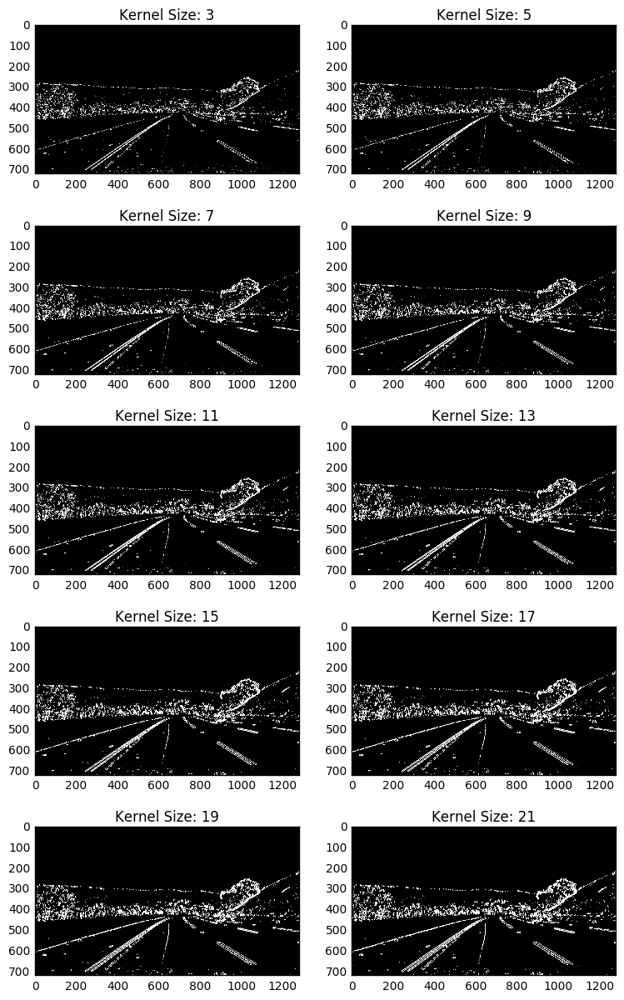

In [6]:
#now, let's take a test picture and figure out, 
#which params produce best results

print("GRAY / SOBEL_X: testing kernel sizes")
img = tst_images[3]
channel = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
disp_images = []
captions = []
for i in range(10):
    ksize = 1 + (i + 1) * 2
    disp_images.append(
        abs_sobel_thresh(channel, orient='x', sobel_kernel=ksize, thresh=(15, 100)))
    captions.append("Kernel Size: {}".format(ksize))
display_images_in_2_colums(disp_images, captions, 'gray')

Good! looks like kernel size f 5 gives best lanes here, let's explore further...
Let's see if we can get a better result from the RED channel only on the same exercise:

RED / SOBEL_X: testing kernel sizes


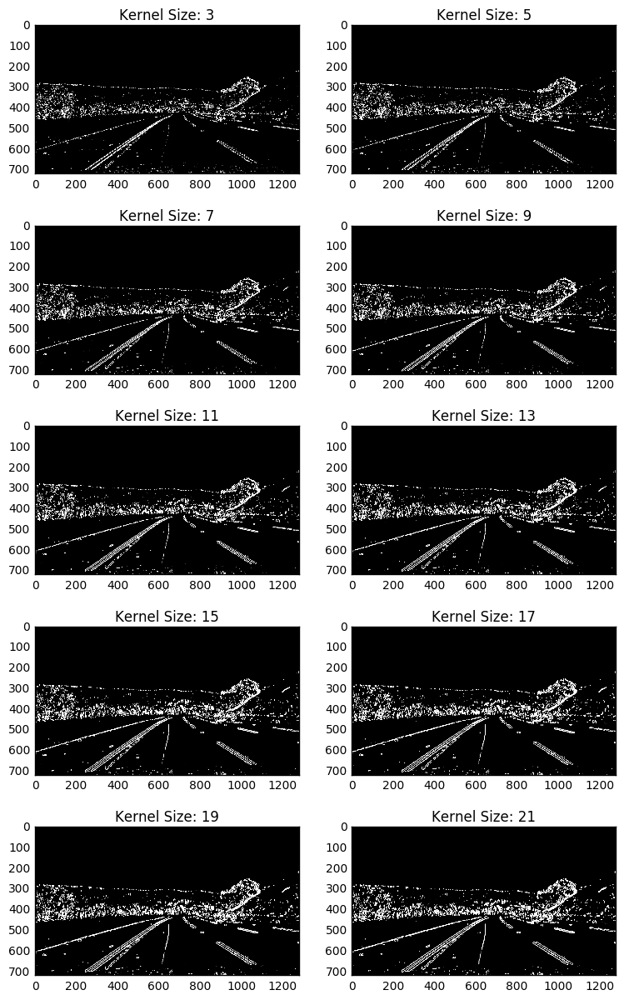

In [7]:
print("RED / SOBEL_X: testing kernel sizes")
img = tst_images[3]
channel = img[:,:,0]
disp_images = []
captions = []
for i in range(10):
    ksize = 1 + (i + 1) * 2
    disp_images.append(
        abs_sobel_thresh(channel, orient='x', sobel_kernel=ksize, thresh=(15, 100)))
    captions.append("Kernel Size: {}".format(ksize))
display_images_in_2_colums(disp_images, captions, 'gray')

Vey nice, looks like RED with Sobel_X and Kernel size 3 gives us the best view of the lanes so far...

Let's play with the thresholds a little bit:

RED / SOBEL_X: testing thresholds


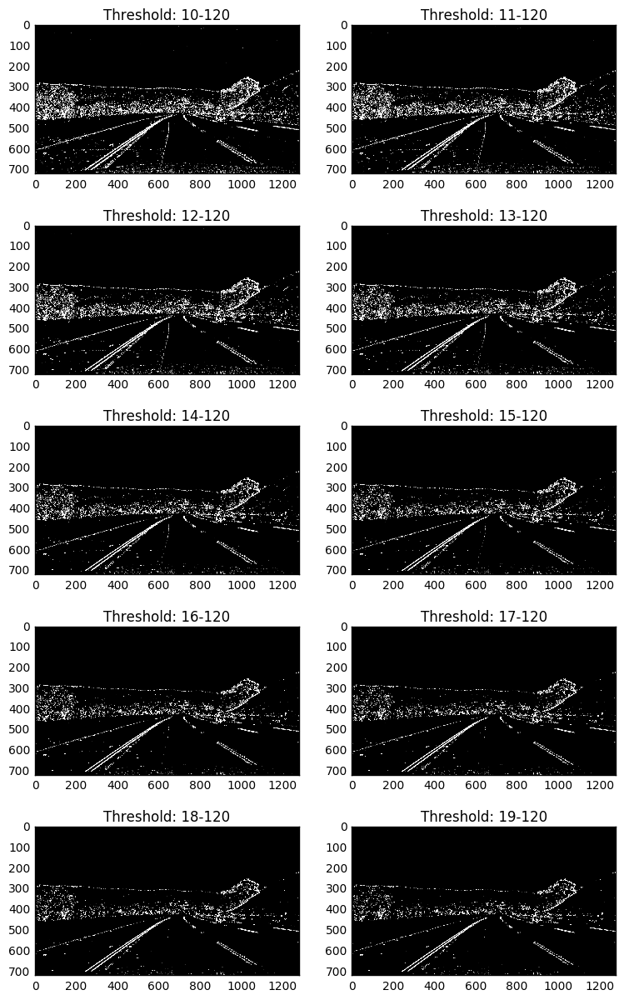

In [8]:
print("RED / SOBEL_X: testing thresholds")
img = tst_images[3]
channel = img[:,:,0]
disp_images = []
captions = []
for i in range(10):
    th_min = i + 10
    th_max = 120#i * 10 + 50
    disp_images.append(
        abs_sobel_thresh(channel, orient='x', sobel_kernel=3, thresh=(th_min, th_max)))
    captions.append("Threshold: {}-{}".format(th_min, th_max))
display_images_in_2_colums(disp_images, captions, 'gray')

Looks like 18x120 threshold on top of the RED channel produced best results so far, let's keep it in our backpocket for now, and see ehat can we do also inside the HLS color space:


SATURATION: testing thresholds on binary filter


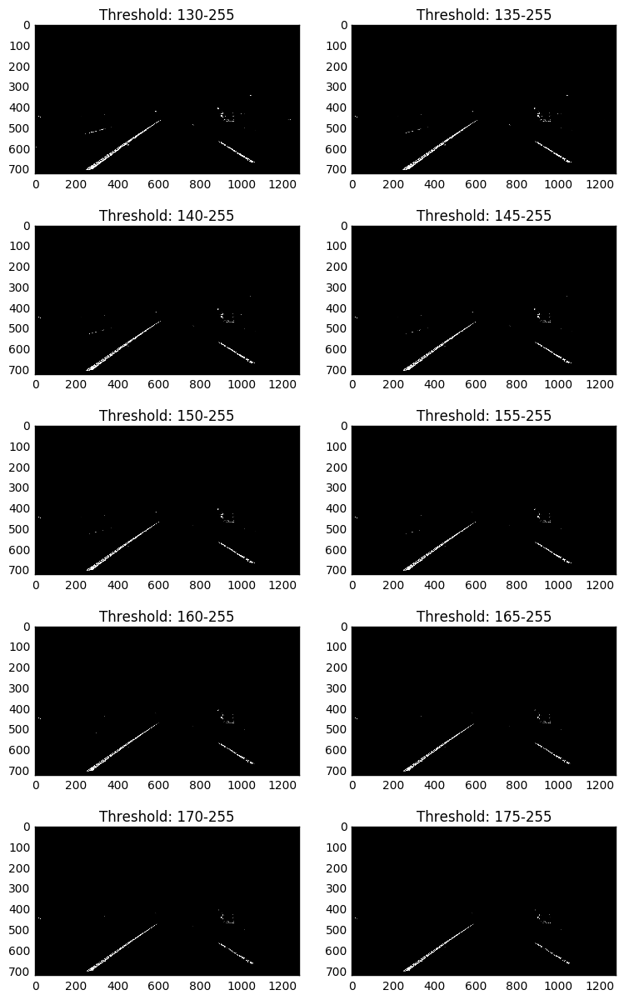

In [9]:
print("SATURATION: testing thresholds on binary filter")
img = tst_images[3]
channel = saturation(img)
disp_images = []
captions = []
for i in range(10):
    th_min = i * 5 + 130
    th_max = 255#i * 5 + 205
    disp_images.append( bin_filter(channel, (th_min, th_max)) )
    captions.append("Threshold: {}-{}".format(th_min, th_max))
display_images_in_2_colums(disp_images, captions, 'gray')

I like the 165x255 threshold here the best - it nicely brings up the left lane line and still keeps the noice level low.

Let's play now a bit with the LIGHT channel and see if we can get more details out of it:

LIGHT: testing thresholds on binary filter


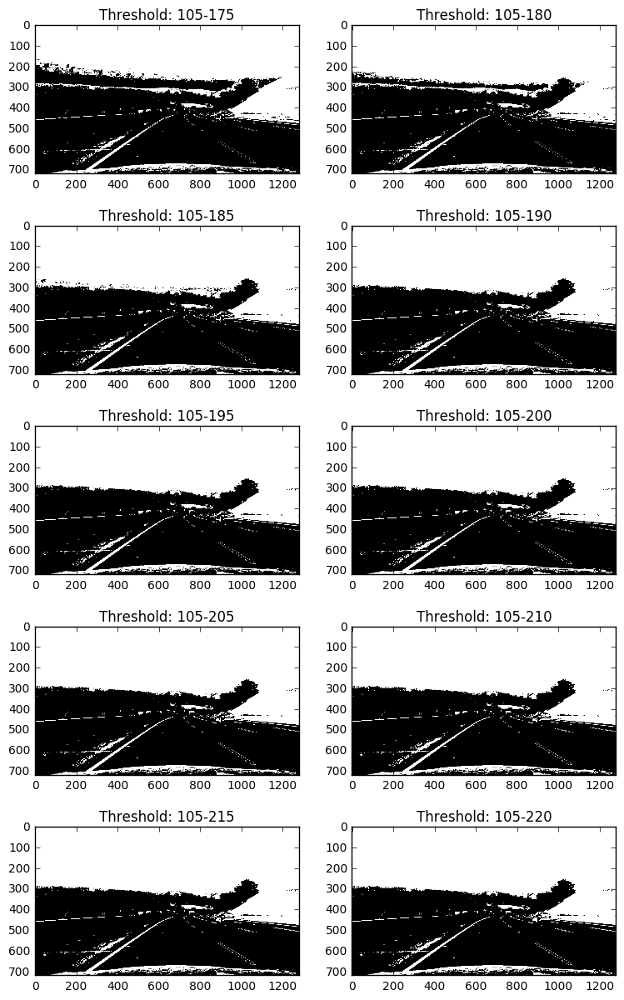

In [10]:
print("LIGHT: testing thresholds on binary filter")
img = tst_images[3]
channel = light(img)
disp_images = []
captions = []
for i in range(10):
    th_min = 105#i * 5 + 90
    th_max = i * 5 + 175
    disp_images.append( bin_filter(channel, (th_min, th_max)) )
    captions.append("Threshold: {}-{}".format(th_min, th_max))
display_images_in_2_colums(disp_images, captions, 'gray')

hmmm... the 105x200 gives a nice view of the left line, but still too much noise. Even if we are going to use it later, then only with the AND filter.

let's see what we can cobine it with? maybe gradient direction on the RED channel:

RED / DIRECTION: testing thresholds


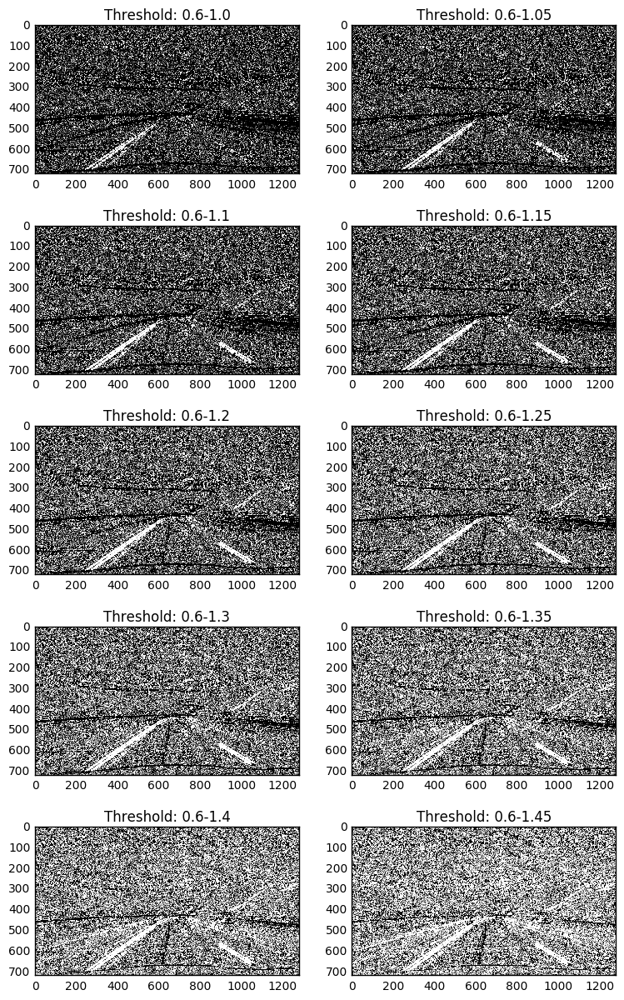

In [11]:
print("RED / DIRECTION: testing thresholds")
img = tst_images[3]
channel = img[:,:,0]
disp_images = []
captions = []
for i in range(10):
    th_min = 0.6#i*0.05 + 0.5
    th_max = i * 0.05 + 1.
    disp_images.append(
        dir_threshold(channel, sobel_kernel=11, thresh=(th_min, th_max)))
    captions.append("Threshold: {}-{}".format(th_min, th_max))
display_images_in_2_colums(disp_images, captions, 'gray')

0.6x1.05 - looks best, but too much noise here, again, even if we are going to use it, then only as AND filter.

RED / DIRECTION: testing kernel size


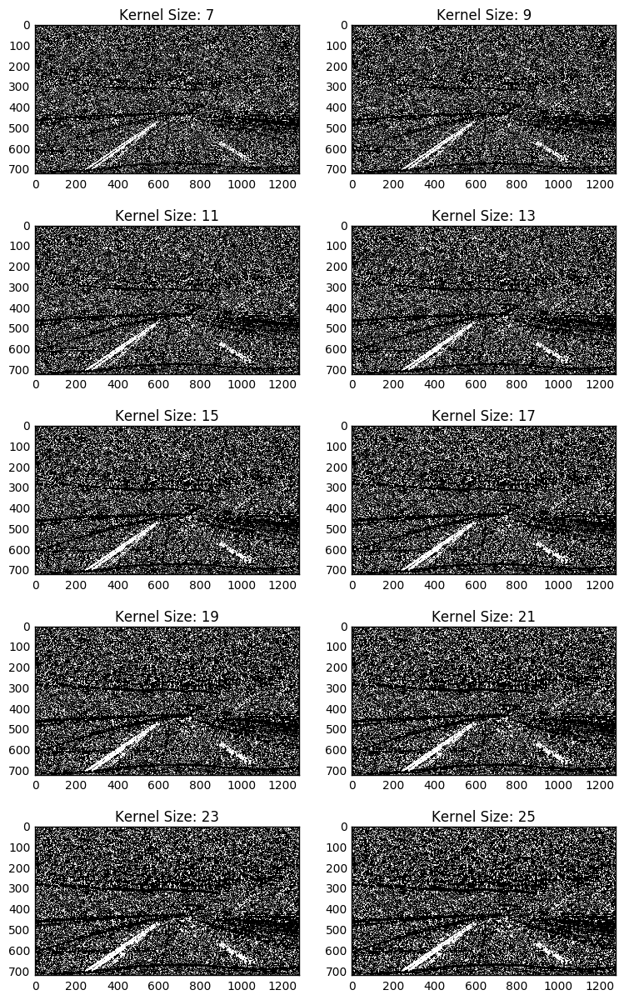

In [12]:
print("RED / DIRECTION: testing kernel size")
img = tst_images[3]
channel = img[:,:,0]
disp_images = []
captions = []
for i in range(10):
    ksize = (i + 1) * 2 + 5
    disp_images.append(
        dir_threshold(channel, sobel_kernel=ksize, thresh=(0.6, 1.05)))
    captions.append("Kernel Size: {}".format(ksize))
display_images_in_2_colums(disp_images, captions, 'gray')

Kernel size of 19 looks best to me, althpough it's hard to say as variation is not that big...

Let's combine it now with the filterred LIGHT channel and see the result:

RED/DIRECTION and filterred LIGHT channel


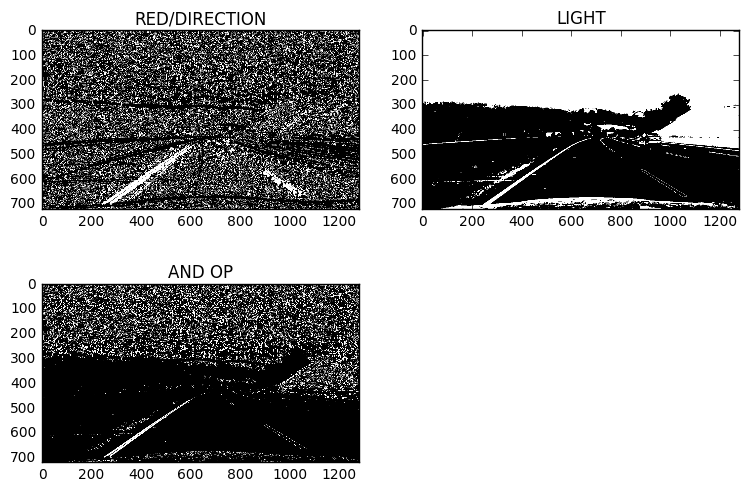

In [13]:
print("RED/DIRECTION and filterred LIGHT channel")
img = tst_images[3]
red_dir = dir_threshold(img[:,:,0], sobel_kernel=19, thresh=(0.6, 1.05))
light_flt = bin_filter(light(img), (105, 200))
combined1 = and_op(red_dir, light_flt) 
display_images_in_2_colums([red_dir, light_flt, combined1], ["RED/DIRECTION", "LIGHT", "AND OP"], 'gray')

looks, OK, but not ideal - still too much noise... let's see what we can get from SATURATION and RED channels:

RED/SOBEL_X or filterred SATURATION channel


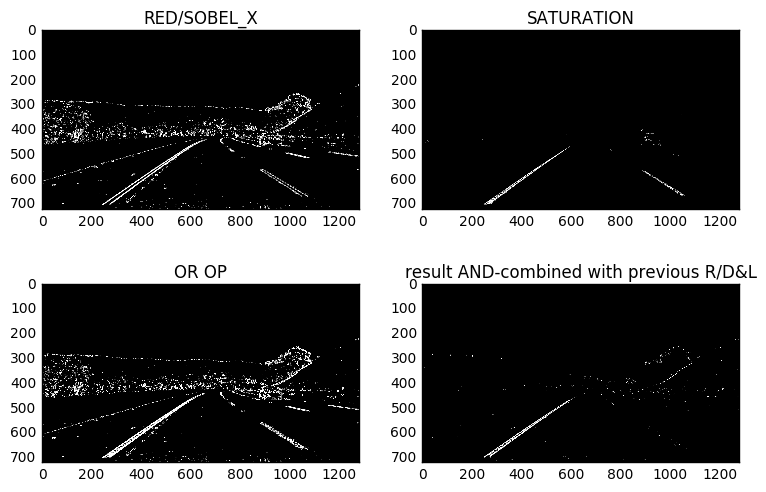

In [14]:
print("RED/SOBEL_X or filterred SATURATION channel")
img = tst_images[3]
red_sob_x = abs_sobel_thresh(img[:,:,0], orient='x', sobel_kernel=3, thresh=(18, 120))
saturation_flt = bin_filter(saturation(img), (165, 255))
combined2 = or_op(red_sob_x, saturation_flt) 
display_images_in_2_colums([red_sob_x, saturation_flt, combined2, and_op(combined1, combined2)], 
                           ["RED/SOBEL_X", "SATURATION", "OR OP", "result AND-combined with previous R/D&L"], 
                           'gray')

Nice! looks like we got a pretty decent filter combination (see "OR OP" figure) working on a complex image... Alas, combination of LIGHT and RED/DIR led us to nowhere at this time... (4th image is the result of combining it with the "OR OP"). 

Let's encapsulate the above filter pipeline into a function and run the rest of the test images through it:

In [15]:
def color_space_filter(img):
    red_sob_x = abs_sobel_thresh(img[:,:,0], orient='x', sobel_kernel=3, thresh=(18, 120))
    saturation_flt = bin_filter(saturation(img), (165, 255))
    combined = or_op(red_sob_x, saturation_flt) 
    return combined

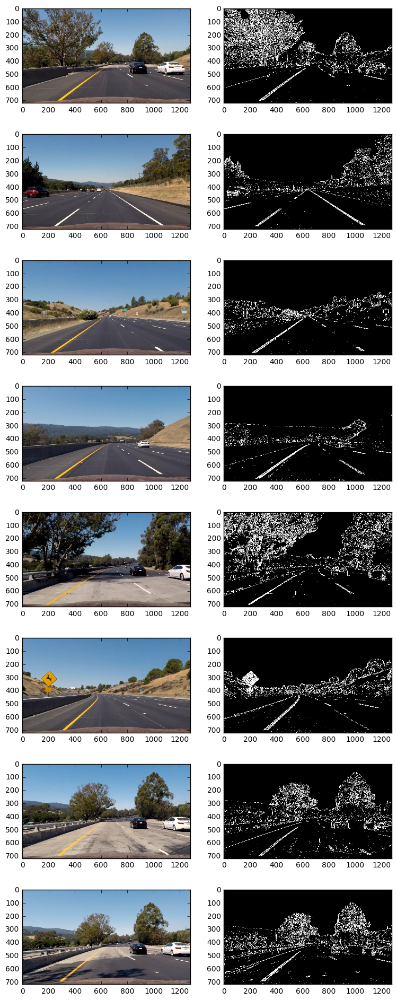

In [16]:
disp_images = []
for img in tst_images:
    disp_images.append(img)
    img_flt = color_space_filter(img)
    disp_images.append(np.dstack((img_flt, img_flt, img_flt))*255)
display_images_in_2_colums(disp_images)

Great! Looks like our color space filter works well!

Let's do the perspective transform now.

## 4. Apply a perspective transform to rectify binary image ("birds-eye view").

Let's choose an image with the straight road ahead. Just to be sure, img.shape: (720, 1280, 3)


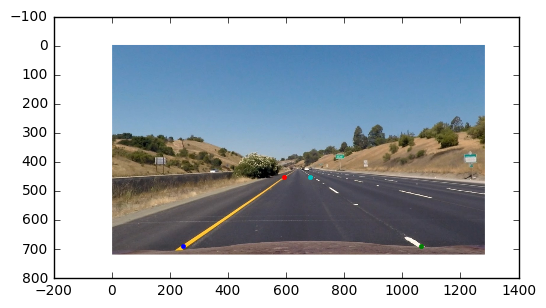

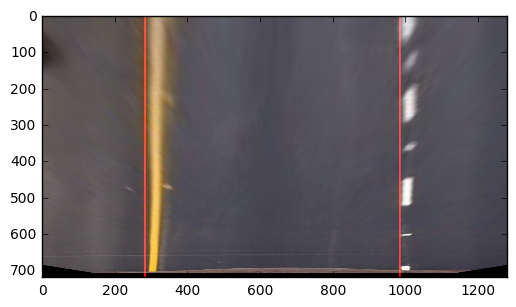

In [17]:
img = tst_images[2]
print("Let's choose an image with the straight road ahead. Just to be sure, img.shape: {}".format(img.shape))
plt.imshow(img)
src = np.float32([[245, 690],[1065, 690],[594, 450],[684, 450]])
plt.plot(src[0][0], src[0][1], '.')
plt.plot(src[1][0], src[1][1], '.')
plt.plot(src[2][0], src[2][1], '.')
plt.plot(src[3][0], src[3][1], '.')
plt.show()
dst = np.float32([[300, 700],[1005,700],[300,0],[1005,0]])
M = cv2.getPerspectiveTransform(src, dst)
M_inv = cv2.getPerspectiveTransform(dst, src)
warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]))
warped[:,280:285,0] = 255
warped[:,980:985,0] = 255
plt.imshow(warped)
plt.show()

#warping the lanes binary output
# print("RES ", res.shape)
# res_warped = cv2.warpPerspective(res, M, (res.shape[1], res.shape[0]))
# plt.imshow(res_warped, cmap='gray')
# plt.show()

Looks good, let's put it into a function, and go through all the binary masks of test images:

In [18]:
def warpPerspective(img):
    warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]))
    return warped

def lanes_warped(img):
    img_flt = color_space_filter(img)
    warped = warpPerspective(img_flt)
    return warped

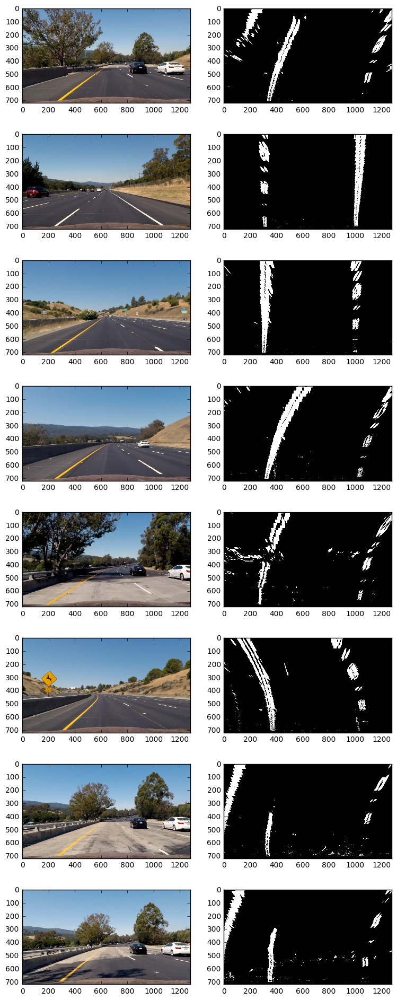

In [19]:
disp_images = []
for img in tst_images:
    disp_images.append(img)
    img_flt = lanes_warped(img)
    disp_images.append(np.dstack((img_flt, img_flt, img_flt))*255)
display_images_in_2_colums(disp_images)

## 5. Detect lane pixels and fit to find the lane boundary
Now, the fun part: detecting the lanes and building 2nd order polynomials to fit in.
I personally like the sliding histogram approach presented in chapter 33 of the materials, so let's use it with some minor tweaks:

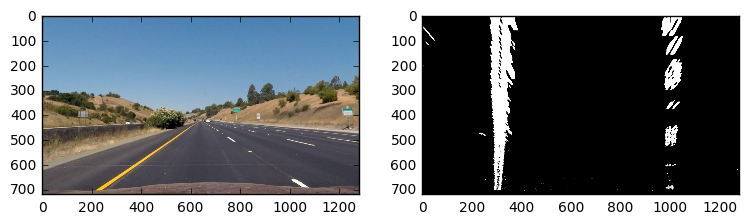

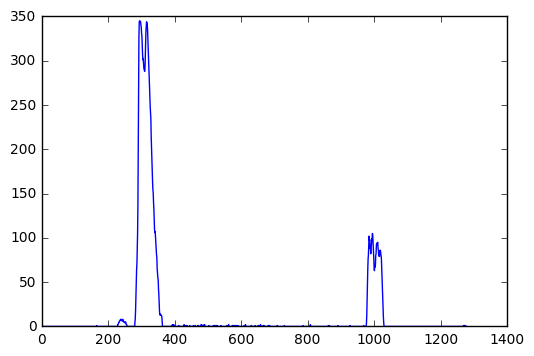

In [20]:
img = tst_images[2]
img_lw = lanes_warped(img)
display_images_in_2_colums([img, np.dstack((img_lw, img_lw, img_lw))*255])
#let's see the histogram of the bottom part of the chsen image
histogram = np.sum(img_lw[img_lw.shape[0] // 2:,:], axis=0)
plt.plot(histogram)

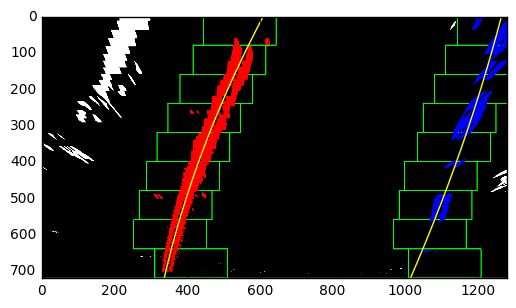

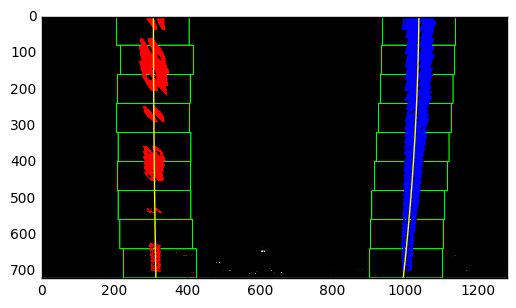

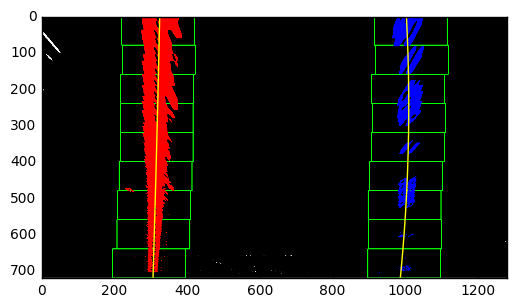

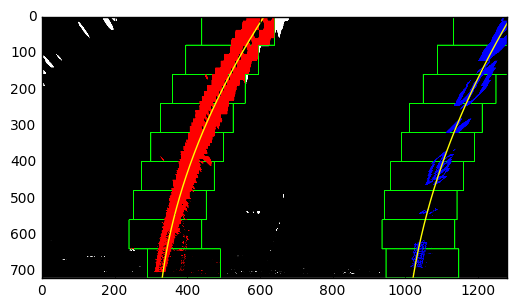

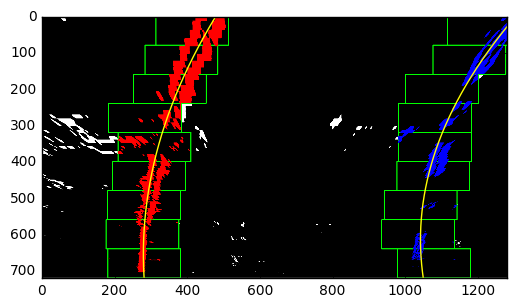

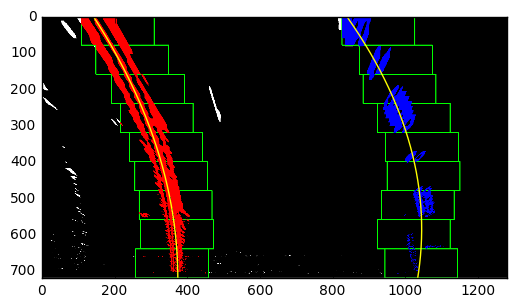

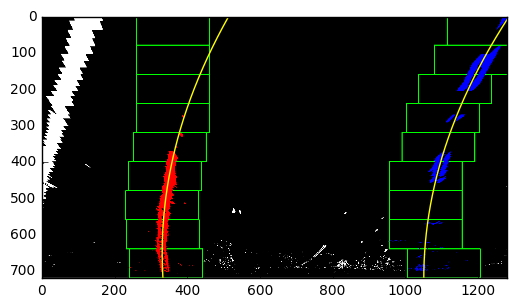

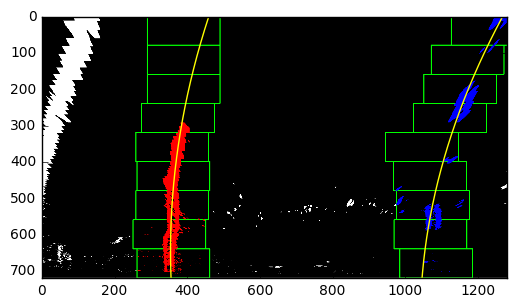

In [21]:
def calc_lane_indexes(img, debug=False):
    img_lw = lanes_warped(img)
    histogram = np.sum(img_lw[img_lw.shape[0] // 2:,:], axis=0)
    if (debug):
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((img_lw, img_lw, img_lw))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(img_lw.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img_lw.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img_lw.shape[0] - (window+1)*window_height
        win_y_high = img_lw.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        if (debug):
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) 
                          & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) 
                           & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    if (debug):
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)

        # Generate x and y values for plotting
        ploty = np.linspace(0, img_lw.shape[0]-1, img_lw.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        ploty_int = ploty.astype(np.int32)
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.show()
    return leftx, lefty, rightx, righty
    
for img in tst_images:
    calc_lane_indexes(img, True)

Looks good so far. The only concern is the very first test image where the right line curves in the wrong direction, but it's OK, as there is no much data on it on the very first image. We should fix it by averaging across multiple frames.

Let's calculate the polynomes now in the real world units - meters, and also deduce the offset of the vehicle from the center of the lane:

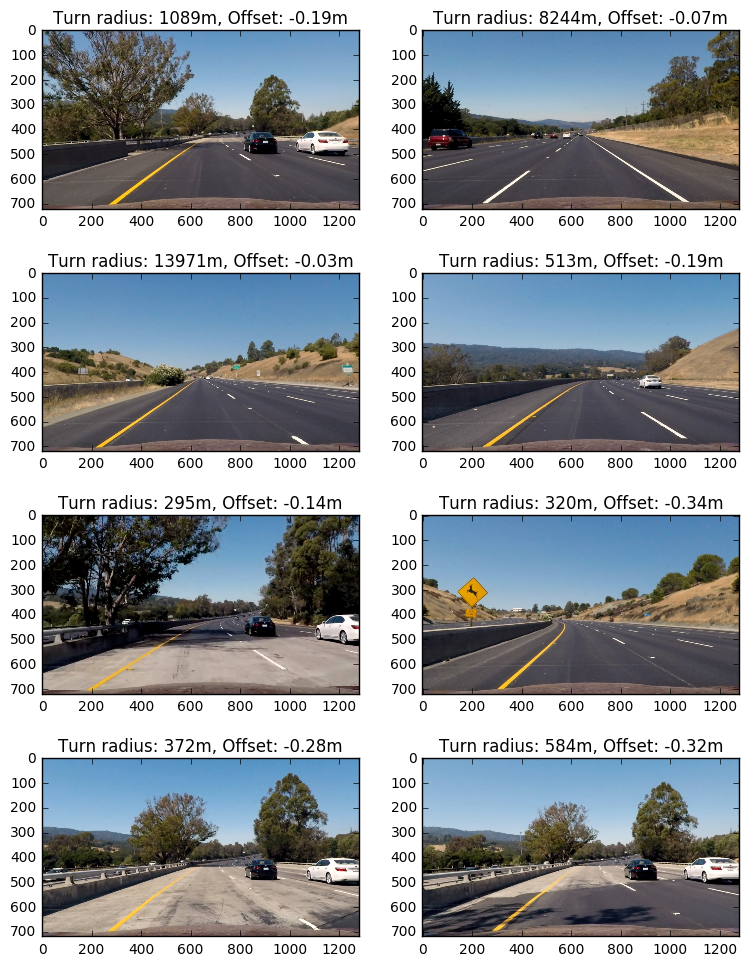

In [22]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30./720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension
xm_per_img = xm_per_pix * tst_images[0].shape[1]

def fit_poly_realworld_units(y, x):
    # Fit new polynomials to x,y in world space
    return np.polyfit(y * ym_per_pix, x * xm_per_pix, 2)

def calc_line_radius_m(poly, y_eval):
    # Calculate the new radii in m of curvature of a line
    return ((1 + (2*poly[0]*y_eval*ym_per_pix + poly[1])**2)**1.5) / np.absolute(2*poly[0])

def calc_lane_radius_m(left_fit, right_fit, y_eval):
    #calculating the radii in m of the turn as averaged of left and right lines
    return (calc_line_radius_m(left_fit, y_eval) + calc_line_radius_m(right_fit, y_eval)) / 2.

def lane_center_offset(left_fit, right_fit, y_eval):
    #Calculating offset of the vehicle from the center of the lane in m
    y_eval = y_eval * ym_per_pix
    left_fitx = left_fit[0]*y_eval**2 + left_fit[1]*y_eval + left_fit[2]
    right_fitx = right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2]

    return xm_per_img / 2. - (left_fitx + right_fitx) / 2.

disp_images = []
captions = []
for img in tst_images:
    #for every test image, calculating pixels which fit the definition of lane lines
    leftx, lefty, rightx, righty = calc_lane_indexes(img)
    #fitting qudratic polinoms for both left and right lines
    left_fit = fit_poly_realworld_units(lefty, leftx)
    right_fit = fit_poly_realworld_units(righty, rightx)
    #getting ready for display
    disp_images.append(img)
    captions.append("Turn radius: {:0.0f}m, Offset: {:0.2f}m".format(
            calc_lane_radius_m(left_fit, right_fit, img.shape[0]),
            lane_center_offset(left_fit, right_fit, img.shape[0])))
#display
display_images_in_2_colums(disp_images, captions)

## 6. Warp the detected lane boundaries back onto the original image.
Allright, now, let's draw the detected lane on top of the original test images:

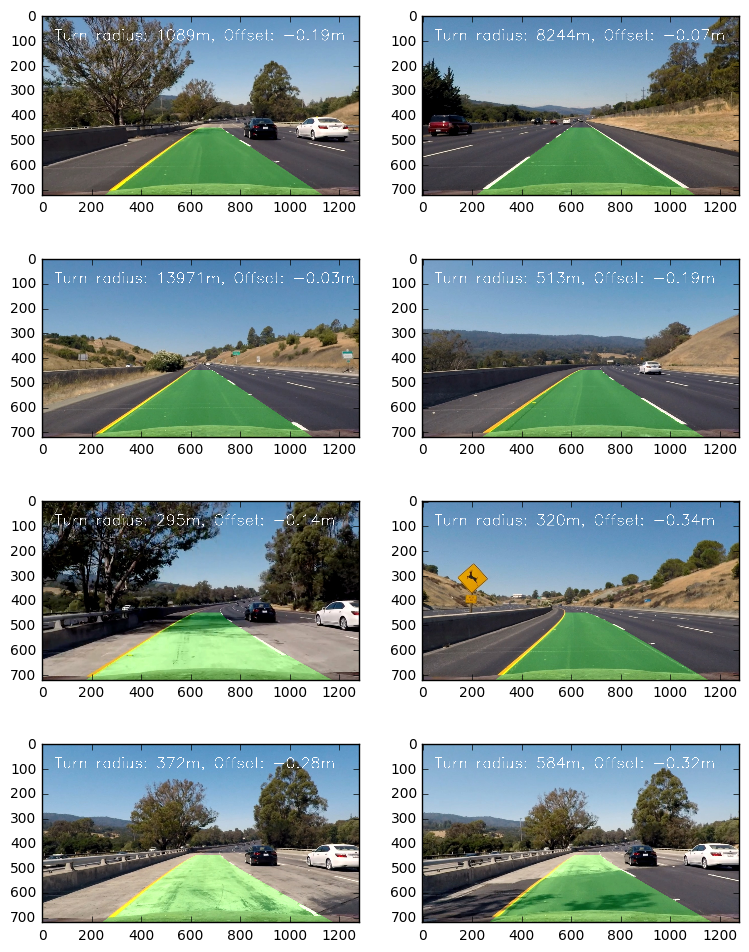

In [23]:
#drawing detected lane area on top of the original image
def draw_lane(img, left_fit, right_fit):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(img[:,:,0]).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0]) * ym_per_pix
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    # we are also translating here meter-based equations into pixel space
    pts_left = np.array([np.transpose(np.vstack([left_fitx / xm_per_pix, ploty / ym_per_pix]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx / xm_per_pix, ploty / ym_per_pix])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_inv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
    caption = "Turn radius: {:0.0f}m, Offset: {:0.2f}m".format(
        calc_lane_radius_m(left_fit, right_fit, img.shape[0]),
        lane_center_offset(left_fit, right_fit, img.shape[0]))
    cv2.putText(result, caption, (50,100), cv2.FONT_HERSHEY_SIMPLEX, 2,(255,255,255),2)
    
    return result

#processing single static image
def process_image(img):
    #for every test image, calculating pixels which fit the definition of lane lines
    leftx, lefty, rightx, righty = calc_lane_indexes(img)
    #fitting qudratic polinoms for both left and right lines
    left_fit = fit_poly_realworld_units(lefty, leftx)
    right_fit = fit_poly_realworld_units(righty, rightx)

    result = draw_lane(img, left_fit, right_fit)
    return result

disp_images = []
for img in tst_images:
    result = process_image(img)
    #getting ready for display
    disp_images.append(result)
#display
display_images_in_2_colums(disp_images)


## 7. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

Cool! That was easy, right? :)) let's do even more cool things now - video processing!

In [24]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [25]:
clip_output = 'project_video_output.mp4'
clip = VideoFileClip("project_video.mp4")
clip_processing = clip.fl_image(process_image)
%time clip_processing.write_videofile(clip_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [01:08<00:00, 18.49it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 1min 51s, sys: 2.36 s, total: 1min 53s
Wall time: 1min 8s


In [26]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(clip_output))

Looks great! Although there is a place on the first bridge, where the left line jumps to the side... let's intorudce some aggregation / line tracking across few recent image frames.


In [27]:
MAX_RADIUS_PCT_DIFFERENCE = 40
MAX_FRAMES_TO_REMEMBER_LANE = 60
Y_EVAL = 720

#let's declare the class to keep track of the Lane lines in a sequence of video frames
class Lane():
    def __init__(self):
        #how many frames ago the lane was detected
        self.detectedFramesAgo = None
        #left line polynomial
        self.left_fit = None
        #right line polynomial
        self.right_fit = None
        
    def fit_polys(self, leftx, lefty, rightx, righty):
        #fitting qudratic polynoms for both left and right lines
        self.left_fit = fit_poly_realworld_units(lefty, leftx)
        self.right_fit = fit_poly_realworld_units(righty, rightx)
        #calculating the radius of two found lines
        left_radius = calc_line_radius_m(self.left_fit, Y_EVAL)
        right_radius = calc_line_radius_m(self.right_fit, Y_EVAL)
        #sanity check: if radius varies more than by MAX_RADIUS_PCT_DIFFERENCE, we don't have a good detection here
#         print("!!!", (np.min([left_radius, right_radius]) / np.max([left_radius, right_radius])))
#         print("+++", (100 - MAX_RADIUS_PCT_DIFFERENCE) / 100.)
        if (np.min([left_radius, right_radius]) / np.max([left_radius, right_radius]) 
            < (100 - MAX_RADIUS_PCT_DIFFERENCE) / 100.):
            #ignoring this detection, as detected line radiuses differs too much
            if (self.detectedFramesAgo is None):
                self.left_fit = None
                self.right_fit = None
            else:
                self.detectedFramesAgo += 1
                if (self.detectedFramesAgo > MAX_FRAMES_TO_REMEMBER_LANE):
                    self.detectedFramesAgo = None
                    self.left_fit = None
                    self.right_fit = None
                    
            return False
        else:
            #good lines detected through histogram
            lane.detectedFramesAgo = 0
            return True

#updating Lane object with the information collected from the current frame
def update_lane(img, lane, debug=False):    
    if (lane.detectedFramesAgo is None):
        #if no Lane has recently been detected, defaulting to histogram-based detection
        leftx, lefty, rightx, righty = calc_lane_indexes(img)
    else:
        #there were lines detected recently, let's use them to search for suitable line pixels in the new img
        img_lw = lanes_warped(img)
        nonzero = img_lw.nonzero()
        nonzeroy = np.array(nonzero[0]) * ym_per_pix
        nonzerox = np.array(nonzero[1]) * xm_per_pix
        margin = 50 * xm_per_pix
        xl = lane.left_fit[0]*(nonzeroy**2) + lane.left_fit[1]*nonzeroy + lane.left_fit[2]
        left_lane_inds = ((nonzerox > (xl - margin)) & (nonzerox < (xl + margin)))
        
        xr = lane.right_fit[0]*(nonzeroy**2) + lane.right_fit[1]*nonzeroy + lane.right_fit[2]
        right_lane_inds = ((nonzerox > (xr - margin)) & (nonzerox < (xr + margin)))  

        # Again, extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds] / xm_per_pix
        lefty = nonzeroy[left_lane_inds] / ym_per_pix
        rightx = nonzerox[right_lane_inds] / xm_per_pix
        righty = nonzeroy[right_lane_inds] / ym_per_pix
        
        if (debug):
            tmp = np.zeros_like(img_lw)
            tmp[lefty.astype(np.int32),leftx.astype(np.int32)] = 255
            plt.imshow(tmp, cmap='gray')
            plt.show()
    #trying to fit the polynoms into the detected pixels, and doing sanity checks
    lane.fit_polys(leftx, lefty, rightx, righty)


Frame 1
detectedFramesAgo=0,
left_fit=[  1.07062724e-03  -8.14218611e-02   3.22839242e+00],
right_fit=[  8.95006227e-04  -7.43415582e-02   6.82325128e+00]


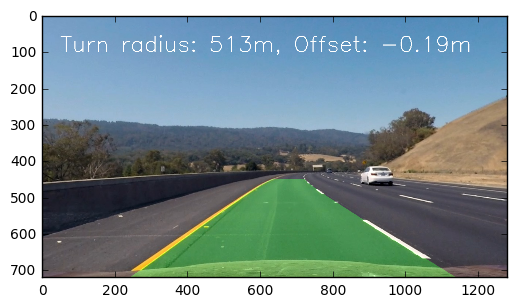

Frame 2


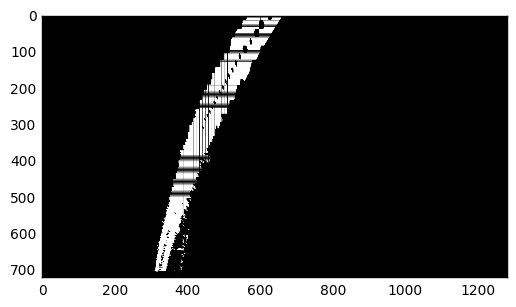

detectedFramesAgo=0,
left_fit=[  1.05674236e-03  -8.15179232e-02   3.23268288e+00],
right_fit=[  8.95006227e-04  -7.43415582e-02   6.82325128e+00]


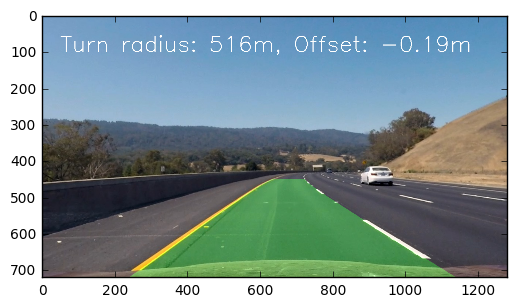

In [28]:
lane = Lane()

def process_video_frame(img, debug=False):
    update_lane(img, lane, debug)
    result = img
    if (not lane.left_fit is None and not lane.right_fit is None):
        result = draw_lane(img, lane.left_fit, lane.right_fit)
    return result

#just making sure our video processing pipeline works:
img = tst_images[3]
print("Frame 1")
plt.imshow(process_video_frame(img, True))
print("detectedFramesAgo={},\nleft_fit={},\nright_fit={}".format(lane.detectedFramesAgo, lane.left_fit, lane.right_fit))
plt.show()

print("Frame 2")
plt.imshow(process_video_frame(img, True))
print("detectedFramesAgo={},\nleft_fit={},\nright_fit={}".format(lane.detectedFramesAgo, lane.left_fit, lane.right_fit))
plt.show()


In [30]:
#now, let's process the video!
#new Lane aggregator
lane = Lane()
clip_output = 'project_video_output_aggregator.mp4'
clip = VideoFileClip("project_video.mp4")
clip_processing = clip.fl_image(process_video_frame)
%time clip_processing.write_videofile(clip_output, audio=False, progress_bar=False)
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(clip_output))

[MoviePy] >>>> Building video project_video_output_aggregator.mp4
[MoviePy] Writing video project_video_output_aggregator.mp4
[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output_aggregator.mp4 

CPU times: user 1min 45s, sys: 2.2 s, total: 1min 47s
Wall time: 1min 2s


Great! This last video has much more stable turn radius, offset values, and better handling of lane boundaries over bridges.